In [1]:
import gym
from gym.spaces import Discrete, MultiDiscrete
import numpy as np
import random as rand
import matplotlib.pyplot as plt
import math

In [2]:
class Grid(gym.Env):
    
    def __init__(self, **kwargs):        
    
        super().__init__()
        
        self.width = kwargs.get('width',8)
        self.height = kwargs.get('height',8)     
        
        self.action_space = gym.spaces.Discrete(5)
        self.observation_space = self.width*self.height #MultiDiscrete([self.width, self.height])
        
        self.max_x = self.width - 1
        self.max_y = self.height - 1
        
        self.episodes = 10000
        
        self.x = 0
        self.y = 0
        self.reward = 0
        
#         self.carolsx = rand.randint(0,7)
#         self.carolsy = rand.randint(0,7)

    def step(self, action):        
        state = 1    
        reward = 0          
        done = True
        info = {}
        return state, reward, done, info

    def reset(self):
        self.x = 0
        self.y = 0                
        return np.array([self.x,self.y])
  
    def render(self, mode):
        pass

In [ ]:
#from stable_baselines3.common.env_checker import check_env

In [3]:
from enum import IntEnum

class Actions(IntEnum):  
    Stay  = 0    
    North = 1
    East  = 2
    South = 3
    West  = 4
#     Diagonal = 5

    def __str__(self): return self.name 

In [ ]:
val = Actions(Actions.East)
val
env.state

In [ ]:
Actions

In [4]:
class GridforPaul( Grid ):

    metadata = {'render_modes': ['human']}
  
    def __init__(self, **kwargs):
        super().__init__(**kwargs)
      
      #defining positions for the grid
        self.start = kwargs.get('start',[0,0])       
        self.end = kwargs.get('end',[self.max_x,self.max_y])        
      
        self.initial_pos = kwargs.get('initial_pos',self.start)  

      # initializing Paul's position
        self.x = self.initial_pos[0]
        self.y = self.initial_pos[1]
        
        self.bank = self.width + 2
    
    ##Paul randomly chooses an action. 
        
        
    def choose_action(self):
        #actions_dict = [Actions.Stay, Actions.North, Actions.East, Actions.South, Actions.West, Actions.Diagonal]
        actions_dict = [Actions.Stay, Actions.North, Actions.East, Actions.South, Actions.West]
        value = rand.randint(0,4)
        action = actions_dict[value]
        #print(action)
        return action
    
    ###see with each step if Paul runs into Carol and gets caught. 
    
    
    def carolspicker(self, action):
        original_pos_x = self.x
        original_pos_y = self.y
        #values_ops = [0, 1, 2, 3, 4, 5]
        listed_actions = []
        for i in range(0, 5):
            #print(self.x, self.y)
            action_upd = Actions(i)
            #print(action_upd)
            new_val = self.take_action(action_upd)
            eDistance = math.dist([self.x, self.y], [3, 3])
            listed_actions.append(eDistance)
            self.x = original_pos_x
            self.y = original_pos_y
        carols_pick = min(listed_actions)
        index = listed_actions.index(carols_pick)
            #print(index)
        #print(listed_actions)
        action = Actions(index)
        #action = values_ops[index]
        #print(action)
        return action
    def carolschoice(self, action):
        #action = self.choose_actions()
        value = rand.choice([-1,1])
        #print(value)
        if value == 1:
            #print(action)
            self.bank -=1
            return action
            
        else:
            action = self.carolspicker(action)
            self.bank -=1
            #print(action)
            return action
        
    def checkcarolsloc(self, val1, val2):
        done = False
        if self.x == val1:
            if self.y == val2:
                reward = -100
                done = True
                print("You have been caught; game is over")
        return done
    
    
    ####actually moving on the grid
      
    def take_action(self, action):
#         actions_dict = [Actions.Stay, Actions.North, Actions.East, Actions.South, Actions.West]
#         value = rand.randint(0,5)
#         action = actions_dict[value]
#         print(action)
        
        
#         actions_dict = [Actions.Stay, Actions.North, Actions.East, Actions.South, Actions.West]
#         value = rand.randint(0,5)
#         action = actions_dict[value]
#         print(action)

        if action == Actions.Stay:
            return "No change has been made. The current coordinates are ({0}, {1}) ".format(self.x, self.y)
        
      # move in the direction of the specified action
        elif action == Actions.North: 
#             action = self.carolschoice(action)
#             print(action)
#             if action == Actions.North:
            self.y += 1
            #self.bank -=1
            #print(self.x, self.y)
#         else:
#                 self.y -= 1
#                 print(self.x, self.y)

            #self.bank -=1

        elif action == Actions.East:
            self.x += 1
            #print(self.x, self.y)
            #self.bank -=1
        
        elif action == Actions.South: 
#             action = self.carolschoice(action)
#             print(action)
#             if action == Actions.South:
#                 self.y += 1
#                 print(self.x, self.y)
#             else:
            self.y -= 1
            #self.bank -=1
            #print(self.x, self.y)
            #self.bank -=1
        elif action == Actions.West:
            self.x -= 1
            #self.bank -=1
            #print(self.x, self.y)
#         elif action == Actions.East:
#             self.x += 1
#             #print(self.x, self.y)
            #self.bank -=1
            
#         elif action == Actions.Diagonal:
#             choice_x = rand.randrange(0, 360)
#             choice_y = rand.randrange(0, 360)
#             self.x += math.cos(choice_x)
#             self.y += math.sin(choice_y)
#             #self.bank -=1
        
        else:
            pass
        
        return self.x, self.y
    

      
      # staying on the grid until exit
        if self.x < 0: 
            self.x = 0
        if self.y < 0: 
            self.y = 0
        if self.x > self.max_x: 
            self.x = self.max_x
        if self.y > self.max_y: 
            self.y = self.max_y 
            
    ### seeing how Carol's choice impacts his actions and directions -> randomly chosen

        
    def step(self, action): 

      # take the action and update the position
        self.take_action(action)
        #self.carolschoice(action)
        obs = np.array([self.x,self.y])
        reward = 0
            
      # set the 'done' flag if we've reached the exit
        done = (self.x == self.end[0]) and (self.y == self.end[1])
      
      # get -1 reward for each step and -100 if you end up in Carol's spot
        if done:
            reward = 0
        elif self.checkcarolsloc(3,3):
            reward = -100
            done = True
            #return "The game is over"
        elif self.bank == 0:
            done = True
        else:
            reward = -1
        info = {}
        return self.bank, obs, reward, done, info     


#     def render(self, mode='human', action=0, reward=0 ):
#         if mode == 'human':
#             print(f"{Actions(action): <5}: ({self.x},{self.y}) reward = {reward}") 
#         else:
#             super().render(mode=mode) # just raise an exception

reward = 0 if done else -

In [5]:
env = GridforPaul()
env.reset()

array([0, 0])

In [ ]:
action = env.choose_action()

In [ ]:
env.bank

In [ ]:
env.action_space.sample()

In [ ]:
print(env.take_action(action))

## Starting the Q-Learning Process

In [6]:
#qtable = np.zeros((16, 4))

nb_states = env.observation_space  # = 64
nb_actions = env.action_space     # = 5
qtable = np.zeros((64,5))
print('Q-table =')
print(qtable)

Q-table =
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]


In [ ]:
values_ops = [1, 2, 3, 4, 5, 6]
values_ops[Actions(5)]

Q-table before training:
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0

[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: 3
3
[ -1.         -20.66715656]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-1.        -1.0002433]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-1.         -0.99999998]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1.    -0.992]
This is the action chosen: 2
This is the action Carol chose: East
2
[-1.     -0.9984]
This is the action chosen: 1
This is the action Carol chose: South
3
[-1.         -0.99999744]
This is the action chosen: 2
This is the action Carol chose: East
2
[-1.15713475 -1.        ]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1.        -0.9999999]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-1.00004866 -1.        ]
This is the action chosen: 3
This is the action Carol chose: South
3
[-4.93343131 -0.99999949]
This is the

[-80.35814825 -80.8591873 ]
This is the action chosen: 1
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: 2
2
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-1.      -1.12672]
This is the action chosen: 2
This is the action Carol chose: East
2
[-1.         -4.93461375]
This is the action chosen: 2
This is the action Carol chose: 2
2
[-1.         -1.78692275]
This is the action chosen: 3
This is the action Carol chose: East
2
[-1.         -1.15738455]
This is the action chosen: 4
This is the action Carol chose: East
You have been caught; game is over
2
[-83.36821255 -80.23147691]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chos

[-20.13999163 -20.13999163]
This is the action chosen: 2
This is the action Carol chose: West
You have been caught; game is over
4
[-83.49472008 -80.20506886]
This is the action chosen: 3
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: 2
2
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: East
2
[-1.         -1.00102357]
This is the action chosen: 1
This is the action Carol chose: East
2
[-1.         -1.00020471]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: 3
3
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: 2
2
[-1.00004094 -1.        ]
This is the action chosen: 3
This is the action Carol chose: North
1
[-1.02538624 -1.        ]
This is the a

[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: East
2
[ -1.         -16.96672001]
This is the action chosen: 3
This is the action Carol chose: 3
3
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: 3
3
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: North
1
[-1.025344 -1.      ]
This is the action chosen: 2
This is the action Carol chose: North
1
[-1.0050688 -1.       ]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: 2
2
[-4.193344 -4.193344]
This is the action chosen: 1
This is the action Carol chose: 1
You have been caught; game is over
1
[-80.32676055 -80.20101376]
This is the action chosen: 4
This is the 

[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: 2
2
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: 3
3
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: East
2
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: East
2
[-4.29979692 -1.        ]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: South
You have been caught; game is over
3
[-96.16673006 -99.86816863]
This is the action chosen: 2
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: East
2
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: East
2
[-1.         -1.65995938]
This is the action chosen: 2
This is the action Carol ch

[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: East
2
[-1.         -4.19354682]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-1.         -1.00000811]
This is the action chosen: 2
This is the action Carol chose: 2
2
[ -1.         -17.63179691]
This is the action chosen: 4
This is the action Carol chose: East
You have been caught; game is over
2
[-80.83870936 -83.52635938]
This is the action chosen: 3
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: East
2
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: East
2
[ -1.         -16.96774187]
This is the action chosen: 1
This is the action Carol chose: North
1
[-1.00000162 -1.00000162]
This is the action chosen: 3
This is the action Carol chose: East
You have been caught; game is over
2
[-83.39354837 -96.70527188]
This is the action chos

[-4.2957422 -1.       ]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-4.8016 -1.    ]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: South
3
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-1.00020308 -1.        ]
This is the action chosen: 3
This is the action Carol chose: South
3
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: 4
4
[ -1.         -17.60133577]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: East
2
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: South
3
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: East
2
[-1.13183747 -1.        ]


[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: East
2
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: East
2
[ -1.         -20.03439838]
This is the action chosen: 3
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: East
You have been caught; game is over
2
[-84.00687968 -96.70522932]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: East
2
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: 2
2
[ -1.

[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: 3
3
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: East
2
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: East
2
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: East
2
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: 2
2
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: East
2
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1. -1.]
Thi

[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: East
2
[-1.         -1.65898617]
This is the action chosen: 2
This is the action Carol chose: 2
2
[-1.         -1.13179723]
This is the action chosen: 4
This is the action Carol chose: North
1
[-1.6386688 -1.6386688]
This is the action chosen: 2
This is the action Carol chose: 2
You have been caught; game is over
2
[-80.22635945 -99.99999805]
This is the action chosen: 1
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: East
2
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: East
2
[ -1.         -16.84527189]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-1.         -1.12773376]
This is the

[-1.00510937 -1.        ]
This is the action chosen: 2
This is the action Carol chose: 2
2
[-4.9346543  -1.02554844]
This is the action chosen: 1
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: West
You have been caught; game is over
4
[-96.04000008 -96.04000008]
This is the action chosen: 0
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: East
2
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: 3
3
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: East
2
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose

[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: 3
3
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: East
2
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: East
2
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: East
2
[ -1.         -20.13476062]
This is the action chosen: 1
This is the action Carol chose: North
1
[-1.00000162 -1.00000162]
This is the action chosen: 3
This is the action Carol chose: East
You have been caught; game is over
2
[-84.026952

[ -1.         -20.03841319]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: 3
3
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: 2
2
[-4.17307691 -1.        ]
This is the action chosen: 4
This is the action Carol chose: North
1
[-16.9669247  -1.       ]
This is the action chosen: 3
This is the action Carol chose: North
You have been caught; game is over
1
[-83.39338494 -80.32672   ]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: East
2
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: 2
2
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: East
2
[-1. -1.]
This is the action chosen: 2
This is the action 

[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: 2
2
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: East
2
[-1.         -1.02534564]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: 3
3
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: North
1
[-16.84  -1.  ]
This is the action chosen: 4
This is the action Carol chose: North
1
[-4.168 -4.168]
This is the action chosen: 2
This is the action Carol chose: 2
You have been caught; game is over
2
[-80.20506913 -83.39947725]
This is the action chosen: 4
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: 3
3
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: 

[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: 3
3
[-1.66426616 -1.63360844]
This is the action chosen: 3
This is the action Carol chose: 3
3
[-1.13285323 -1.        ]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: 2
2
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: 2
2
[-1.         -1.02636788]
This is the action chosen: 1
This is the action Carol chose: West
4
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: 3
3
[-1.02657065 -1.        ]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-1. -1.]
This is the act

[-83.36804219 -80.2       ]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: East
2
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: East
2
[-1.         -1.13284318]
This is the action chosen: 0
This is the action Carol chose: East
2
[-1.         -1.02656864]
This is the action chosen: 1
This is the action Carol chose: North
1
[-16.84 -16.84]
This is the action chosen: 2
This is the action Carol chose: East
You have been caught; game is over
2
[-80.20531373 -84.03327189]
This is the action chosen: 2
This is the action Carol chose: 2
2
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-1. -1.]
This is the action chosen: 3
This is

[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: East
2
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: East
2
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: 2
2
[ -1.         -17.47360845]
This is the action chosen: 2
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: East
You have been caught; game is over
2
[-83.49472169 -96.16697311]
This is the action chosen: 4
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: East
2
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: North
1
[

[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-1.         -1.00000162]
This is the action chosen: 2
This is the action Carol chose: 2
2
[ -1.         -20.79878342]
This is the action chosen: 2
This is the action Carol chose: East
You have been caught; game is over
2
[-96.16773545 -84.15975668]
This is the action chosen: 2
This is the action Carol chose: 2
2
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: 2
2
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: East
2
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: East
2


[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: East
2
[-1.         -1.13200005]
This is the action chosen: 3
This is the action Carol chose: East
2
[-1.         -1.02640001]
This is the action chosen: 1
This is the action Carol chose: 1
1
[ -1.    -20.008]
This is the action chosen: 3
This is the action Carol chose: East
2
[ -1.         -20.67323944]
This is the action chosen: 2
This is the action Carol chose: East
You have been caught; game is over
2
[-80.20528    -84.13464789]
This is the action chosen: 4
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: East
2
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: 3
3
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 

[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: East
2
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: 3
3
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: East
2
[-1.         -1.63867042]
This is the action chosen: 2
This is the action Carol chose: North
1
[-16.865344 -16.865344]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: East
You have been caught; game is over
2
[-80.32773408 -99.87202132]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: 2
2
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: 

[-1.00000001 -1.00000001]
This is the action chosen: 4
This is the action Carol chose: East
You have been caught; game is over
2
[-80.83871785 -99.99995101]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: 3
3
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: 2
2
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: East
2
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: East
2
[ -1.         

[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: East
2
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: 3
3
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: 2
2
[ -1.         -16.97199157]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-1.03046146 -1.03046146]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: 2
You have been caught; game is over
2
[-83.39439831 -99.97465566]
This is the action chosen: 3
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: Ea

[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1.         -1.63360811]
This is the action chosen: 3
This is the action Carol chose: 3
3
[-1.         -1.66421555]
This is the action chosen: 1
This is the action Carol chose: East
2
[-1.         -4.29978914]
This is the action chosen: 3
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: 2
You have been caught; game is over
2
[-80.85995783 -99.23461114]
This is the action chosen: 3
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: East
2
[ -1.         -16.97199157]
This is the action chosen: 2
This is the action Carol chose: 2
2
[-1.         -4.19439831]
This is the action chosen: 1
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: 2
You have been caught; ga

[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: East
2
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: East
2
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: East
2
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: 2
2
[-1.         -1.66507686]
This is the action chosen: 1
This is the action Carol chose: North
1
[-16.84000032 -16.84000032]
This is the action chosen: 1
This is the action Carol chose: East
You have been caught; game is over
2
[-80.33301537 -99.3653846 ]
This is the action chosen: 2
This is the action Carol chos

[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: East
You have been caught; game is over
2
[-83.49496499 -99.84769108]
This is the action chosen: 3
This is the action Carol chose: 3
3
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: 2
2
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: East
2
[ -1.       -17.498993]
This is the action chosen: 2
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: 3
3
[-1.         -1.03142662]
This is the action chosen: 2
This is the action Carol chose:

[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: 3
3
[-1.         -1.13199968]
This is the action chosen: 1
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-1.         -1.76640418]
This is the action chosen: 3
This is the action Carol chose: East
2
[-1.15231574 -1.        ]
This is the action chosen: 1
This is the action Carol chose: South
You have been caught; game is over
3
[-80.22639994 -84.15999994]
This is the action chosen: 4
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1. -1.]
This is the action chosen: 2
This is the action C

[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: 2
2
[-4.19846153 -1.        ]
This is the action chosen: 2
This is the action Carol chose: 2
2
[-20.03866592  -1.        ]
This is the action chosen: 3
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: 3
3
[-20.13999974  -1.        ]
This is the action chosen: 4
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: North
1
[-1.         -1.00000817]
This is the action chosen: 2
This is the action Carol chose: 2
2
[-1.         -4.80773318]
This is the action chosen: 1
This is the action Carol chose: 1
1
[ -1.         -17.50421758]
This is the action chosen: 4
This is the action Carol chose: West
4
[-1.         -1.00020282]
This is the action chosen: 2
This is the action Carol chose: South
3
[-4.82799995 -4.82799995]
This is 

[ -1.        -17.4746141]
This is the action chosen: 3
This is the action Carol chose: North
1
[-1.00608256 -1.00608256]
This is the action chosen: 1
This is the action Carol chose: East
You have been caught; game is over
2
[-83.49492282 -99.99468589]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: 2
2
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-1.         -1.00121651]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1.         -4.80180308]
This is the action chosen: 2
This is the action Carol chose: East
2
[ -1.         -20.79893718]
This is the action chosen: 1
This is the action Carol chose: East
2
[-1.         -4.95978744]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1.   

[ -1.         -16.96692309]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: North
1
[-1.12672811 -1.12672811]
This is the action chosen: 1
This is the action Carol chose: 1
1
[ -1.02534562 -17.47887358]
This is the action chosen: 2
This is the action Carol chose: East
2
[-4.19338462 -1.        ]
This is the action chosen: 0
This is the action Carol chose: South
You have been caught; game is over
3
[-99.20800812 -99.33983099]
This is the action chosen: 2
This is the action Carol chose: 2
2
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: East
2
[-1.         -1.63867692]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This i

[-1.         -4.16821248]
This is the action chosen: 4
This is the action Carol chose: East
2
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: East
2
[-17.49915486  -1.        ]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-1.6336425 -1.       ]
This is the action chosen: 1
This is the action Carol chose: South
3
[-20.79877499  -1.        ]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1.00507042 -1.12672819]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-1.00004055 -1.        ]
This is the action chosen: 0
This is the action Carol chose: South
3
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: East
2
[-4.29983097 -1.        ]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-1.1267285 -1.       ]
This is the action chosen: 1
This is the action Carol chose: South
3
[-4.959755 -1.      ]
This is the action chosen: 3
This is the action Carol chose: South
You have bee

[-1.        -4.1682112]
This is the action chosen: 2
This is the action Carol chose: East
2
[-1.         -1.63364224]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: 3
3
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: North
1
[-4.168 -1.   ]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: East
2
[-1.         -1.12672845]
This is the action chosen: 2
This is the action Carol chose: 2
2
[-1.02534569 -1.02534569]
This is the action chosen: 2
This is the action Carol chose: North
You have been caught; game is over
1
[-96.04000817 -80.8336    ]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 2
T

[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: 2
2
[ -1.         -16.84506912]
This is the action chosen: 1
This is the action Carol chose: North
1
[-4.168 -4.168]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1.         -1.00101376]
This is the action chosen: 1
This is the action Carol chose: East
2
[ -1.         -17.60661376]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: East
You have been caught; game is over
2
[-83.36901382 -83.52132275]
This is the action chosen: 3
This is the action Carol chose: 3
3
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: East
2
[-1. -1.]
This is the action chosen: 4


[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: 3
3
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: 2
2
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: North
1
[-1.00004055 -1.        ]
This is the action chosen: 4
This is the action Carol chose: North
1
[-1.00000811 -1.00000811]
This is the action chosen: 3
This is the action Carol chose: East
You have been caught; game is over
2
[-84.00160169 -84.0322659 ]
This is the action chosen: 2
This is the action Carol chose: 2
2
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: 3
3
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: East
2
[ -1.         -17.60032034]
This is the action chosen: 4
This is

[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: 2
2
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: North
1
[-16.84  -1.  ]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: East
2
[-1.         -1.65894595]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: East
2
[-1.         -1.13178919]
This is the action chosen: 2
This is the action Carol chose: 2
2
[-1.02635784 -1.02635784]
This is the action chosen: 4
This is the action Carol chose: North
You have been caught; game is over
1
[-96.04000811 -83.368     ]
This is the action chosen: 4
This is the act

[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-1.         -1.02534569]
This is the action chosen: 3
This is the action Carol chose: East
2
[-1.13182935 -1.        ]
This is the action chosen: 2
This is the action Carol chose: South
You have been caught; game is over
3
[-84.02800675 -96.80664782]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: East
2
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: East
2
[-1.         -1.02636587]
This is the action chosen: 3
This is the action Carol chose: 3
3
[-1. -1.]
This is the action chosen: 3
This is the action Car

[ -1.         -20.00800818]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: East
2
[-1.         -4.80160164]
This is the action chosen: 3
This is the action Carol chose: 3
3
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: East
2
[-1.         -1.76032033]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: East
2
[-1.         -1.15206407]
This is the action chosen: 3
This is the action Carol chose: 3
3
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the act

[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: East
2
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: East
2
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: 2
2
[-1.         -1.13199973]
This is the action chosen: 4
This is the action Carol chose: North
1
[-1.6336 -1.6336]
This is the action chosen: 3
This is the action Carol chose: East
You have been caught; game is over
2
[-80.22639995 -80.86506881]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: East
2
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: Nor

[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: East
2
[ -1.         -20.00820444]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-1.6336 -1.6336]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: East
You have been caught; game is over
2
[-84.00164089 -96.17204224]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: 2
2
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: East
2
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: East

[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: 3
3
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: 2
2
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: East
You have been caught; game is over
2
[-99.33593653 -99.36537644]
This is the action chosen: 3
This is the action Carol chose: 3
3
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: 2
2
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: 3
3
[-1. -1.]
This is the action cho

[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: East
2
[-1.         -1.65898618]
This is the action chosen: 3
This is the action Carol chose: North
1
[-1.02534408 -1.02534408]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1.        -1.0050688]
This is the action chosen: 3
This is the action Carol chose: East
2
[-1.         -1.79199805]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-1.00506882 -4.17412481]
This is the action chosen: 0
This is the action Carol chose: East
2
[-1.13179724 -1.        ]
This is the action chosen: 3
This is the action Carol chose: South
You have been caught; game is over
3
[-96.6736     -99.20901383]
This is the action chosen: 4
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: 2
2
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: East
2
[-1.

[-83.36821119 -99.97444344]
This is the action chosen: 3
This is the action Carol chose: 3
3
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: 3
3
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: East
2
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: East
2
[ -1.         -17.47364224]
This is the action chosen: 2
This is the action Carol chose: 2
2
[-4.29472845 -4.29472845]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: 1
You have been caught; game is over
1
[-80.23042124 -80.2       ]
This is the action chosen: 0
This is t

[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: 3
3
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: 3
3
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: 3
3
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: East
2
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: 2
2
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: 3
3
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-

[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: 2
2
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: East
2
[-1.         -4.19338457]
This is the action chosen: 0
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: 2
You have been caught; game is over
2
[-80.83867691 -83.37331379]
This is the action chosen: 1
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: East
2
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: East
2
[ 

[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: East
2
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: 3
3
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: 2
2
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: 2
2
[-1.         -1.02656864]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: 2
2
[-1.         -1.00531373]
This is the action chosen: 4
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: East
You have been caught; game is over
2
[-80.20106275 -

[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: East
2
[-1.         -4.29982942]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: 2
2
[-1.         -1.65996588]
This is the action chosen: 0
This is the action Carol chose: East
2
[-1.         -1.13199318]
This is the action chosen: 2
This is the action Carol chose: North
1
[-16.84 -16.84]
This is the action chosen: 3
This is the action Carol chose: East
You have been caught; game is over
2
[-80.22639864 -99.9685731 ]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1. -1.]
This is the action chosen: 0
This is the 

[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: East
2
[ -1.         -20.01433438]
This is the action chosen: 2
This is the action Carol chose: East
You have been caught; game is over
2
[-80.85898651 -84.00286688]
This is the action chosen: 1
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: East
2
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: 2
2
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: East
You have been caught; game is over
2
[-96.1717973  -96.80057338]
This is the action chosen: 3
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1. -1.]
This is the a

[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: East
2
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: 3
3
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: 1
1
[ -1.   -16.84]
This is the action chosen: 3
This is the action Carol chose: East
2
[-1.         -4.32619556]
This is the action chosen: 2
This is the action Carol chose: 2
You have been caught; game is over
2
[-80.35226844 -80.86523911]
This is the action chosen: 3
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: East
2
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: 0
0


[-1.02538462 -1.02538462]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-1.00507692 -4.95367375]
This is the action chosen: 1
This is the action Carol chose: East
2
[-4.2947285 -1.       ]
This is the action chosen: 2
This is the action Carol chose: 2
2
[-17.47973325  -1.        ]
This is the action chosen: 2
This is the action Carol chose: 2
2
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: South
3
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: 3
3
[-1.         -4.32615668]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1.         -1.63380314]
This is the action chosen: 3
This is the action Carol chose: 3
3
[-1.66523134 -4.19338619]
This is the action chosen: 2
This is the action Carol chose: North
1
[-1.         -1.00101538]
This is the action chosen: 4
This is the action Carol chose: West
You have been caught; game is over


[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: East
2
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: East
2
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: East
2
[-1.         -1.00020314]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-16.84020275 -16.84020275]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: 2
2
[-1.         -4.30084352]
This is the action chosen: 0
This is the action Carol chose: East
You have been caught; game is over
2
[-80.20004063 -80.8601687 ]
This is the action chosen: 4
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 1
This is the a

[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: 2
2
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: East
2
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: East
2
[ -1.         -16.84527324]
This is the action chosen: 2
This is the action Carol chose: 2
2
[-4.16905465 -4.16905465]
This is the action chosen: 1
This is the action Carol chose: North
You have been caught; game is over
1
[-80.32793653 -80.20000162]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: East
2
[-1. -1.]
This is the action chosen: 3
This is the action Carol cho

[-16.84000006  -1.        ]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-4.16800001 -4.16800001]
This is the action chosen: 3
This is the action Carol chose: 3
3
[-1.         -1.63364225]
This is the action chosen: 2
This is the action Carol chose: 2
2
[-4.17311098 -4.17311098]
This is the action chosen: 2
This is the action Carol chose: 2
2
[-16.99733756  -1.6346222 ]
This is the action chosen: 3
This is the action Carol chose: 3
3
[-4.17307892 -1.        ]
This is the action chosen: 2
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: North
1
[-1.     -1.6336]
This is the action chosen: 4
This is the action Carol chose: 4
You have been caught; game is over
4
[-96.67380282 -96.04101545]
This is the action chosen: 3
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: East
2
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: Nor

[ -1.         -16.84004089]
This is the action chosen: 0
This is the action Carol chose: East
2
[-1.         -4.29476219]
This is the action chosen: 3
This is the action Carol chose: 3
3
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: 2
2
[-1.65895244 -1.        ]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: 3
3
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: 2
2
[-1.13179049 -1.        ]
This is the action chosen: 0
This is the action Carol chose: North
1
[-1.15734366 -1.        ]
This is the action chosen: 2
This is the action Carol chose: 2
2
[-20.79995101  -1.        ]
This is the action chosen: 3
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: 3
3
[-20.79873481  -1.        ]
This is the action chosen: 4
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 1
Thi

[-1.         -4.16905463]
This is the action chosen: 2
This is the action Carol chose: North
1
[-4.16902194 -4.16902194]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1.         -4.16800811]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: East
2
[ -1.         -20.64691413]
This is the action chosen: 1
This is the action Carol chose: 1
1
[ -1.63380439 -16.84531244]
This is the action chosen: 1
This is the action Carol chose: East
2
[-1.63381093 -1.        ]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-4.16906249 -1.        ]
This is the action chosen: 0
This is the action Carol chose: South
3
[-4.19335406 -1.        ]
This is the action chosen: 3
This is the action Carol chose: South
You have been caught; game is over
3
[-80.83867081 -83.39354845]
This is the action chosen: 3
This is the action Carol chose: 3
3
[-1. -1.]
This is the action chosen: 3
This is 

[-1.         -4.29573377]
This is the action chosen: 3
This is the action Carol chose: 3
3
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: East
You have been caught; game is over
2
[-80.85914675 -96.83199181]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: 2
2
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: 3
3
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This i

[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: East
2
[ -1.        -16.9667298]
This is the action chosen: 4
This is the action Carol chose: East
2
[-1.         -4.19334596]
This is the action chosen: 1
This is the action Carol chose: North
1
[-1.00000001 -1.00000001]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: 2
You have been caught; game is over
2
[-80.83866919 -96.06539435]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: East
2
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: East
2
[-1. -1.]
This is the action chosen: 3
This is the action 

[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1.       -1.025344]
This is the action chosen: 4
This is the action Carol chose: East
2
[-1.         -4.32635102]
This is the action chosen: 1
This is the action Carol chose: East
You have been caught; game is over
2
[-80.20121658 -80.8652702 ]
This is the action chosen: 0
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: 2
2
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: 3
3
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: 3
3
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: East


[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: East
2
[-4.16804219 -1.        ]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1.0050688  -1.12692276]
This is the action chosen: 1
This is the action Carol chose: East
2
[-1.63360844 -1.        ]
This is the action chosen: 4
This is the action Carol chose: South
You have been caught; game is over
3
[-80.96133382 -80.86401287]
This is the action chosen: 3
This is the action Carol chose: 3
3
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: 2
2
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: 2
2
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-1.00101376 -1.        ]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 1
This 

[-1.         -1.00004224]
This is the action chosen: 3
This is the action Carol chose: 3
3
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: North
1
[-16.96672032  -1.        ]
This is the action chosen: 3
This is the action Carol chose: North
1
[-4.19334406 -4.19334406]
This is the action chosen: 1
This is the action Carol chose: East
You have been caught; game is over
2
[-80.20000845 -99.23967961]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: East
2
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: East
2
[ -1.         -16.84000169]
This is the action chosen: 4
This is the action Carol chose: North
1
[-1.63866881 -1.63866881]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1.         -1.63461376]
This is the action chosen: 0
This is the action Carol chose: 0

[-80.22535211 -99.33476258]
This is the action chosen: 3
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: East
2
[ -1.         -16.84507042]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-1.    -4.168]
This is the action chosen: 1
This is the action Carol chose: East
2
[ -1.         -20.66695252]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: East
You have been caught; game is over
2
[-83.36901408 -84.1333905 ]
This is the action chosen: 3
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: East
2
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1. -1.]
This is the action chosen: 0

[ -1.         -20.67327966]
This is the action chosen: 1
This is the action Carol chose: East
2
[-1.         -4.93465593]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: East
2
[-1.         -1.78693119]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: East
You have been caught; game is over
2
[-80.85914682 -80.35738624]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: 3
3
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 3
This is the action Carol

[ -1.         -17.49914839]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: East
You have been caught; game is over
2
[-83.49982968 -99.97339083]
This is the action chosen: 0
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: 3
3
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: 3
3
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: East
2
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: East
2
[-1. -1.

[-83.36804089 -80.83973317]
This is the action chosen: 4
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: East
2
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: East
2
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: 3
3
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: East
2
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: East
2
[ -1.         -16.96794663]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 1
T

[-1.00000812 -1.00000812]
This is the action chosen: 3
This is the action Carol chose: East
You have been caught; game is over
2
[-80.96542968 -99.99897651]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: 2
2
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: 3
3
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: East
2
[ -1.         -16.99308594]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: East
2
[-1.         -4.19861719]
This is the action chosen: 0
This is the 

[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: East
2
[-1.         -1.12672819]
This is the action chosen: 3
This is the action Carol chose: East
2
[-1.         -1.02534564]
This is the action chosen: 0
This is the action Carol chose: North
1
[-16.84 -16.84]
This is the action chosen: 4
This is the action Carol chose: East
You have been caught; game is over
2
[-80.20506913 -96.06640845]
This is the action chosen: 0
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-1.    -4.168]
This is the action chosen: 2
This is the action Carol chose: 2
2
[ -1.         -20.01328169]
This is the action chosen: 4
This is the action Carol chose: East
2
[-1.         -4.80265634]
This is the ac

[-1.12692275 -1.12692275]
This is the action chosen: 4
This is the action Carol chose: East
You have been caught; game is over
2
[-80.35210618 -99.9948887 ]
This is the action chosen: 1
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: 3
3
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: 2
2
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: East
2
[ -1.         -16.87042124]
This is the action chosen: 2
This is the action Carol chose: North
1
[-1.02538455 -1.02538455]
This is the action chosen: 3
This is the action Carol chose: 3
3
[-1.         -1.12793651]
This is the action chosen: 3
This is the action Carol chose: North
1
[-1.00507691 -1.00507691]
This is the action chosen: 2
This is the action Carol chose: 2
You have been caught

[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-1.         -1.15207244]
This is the action chosen: 3
This is the action Carol chose: East
2
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: East
2
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: 3
3
[ -1.         -20.00926713]
This is the action chosen: 4
This is the action Carol chose: East
2
[ -1.         -20.13598524]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: East
You have been caught; game is over
2
[-96.04506887 -84.02719705]
This is the action chosen: 3
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 2
This is the act

[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: East
2
[ -1.         -16.84004219]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: East
2
[-1.         -4.16800844]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-1.6336 -1.6336]
This is the action chosen: 1
This is the action Carol chose: 1
1
[ -1.12672    -16.97200128]
This is the action chosen: 2
This is the action Carol chose: East
2
[-1.63360169 -1.        ]
This is the action chosen: 2
This is the action Carol chose: 2
2
[-17.63195102  -1.        ]
This is the action chosen: 3
This is the action Carol chose: South
3
[-1.76157714 -1.76157714]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-1.         -4.19440026]
This is the action chosen: 2
This is the action Carol chose: South
3
[-1.15231543 -1.15231543]
This i

[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: East
2
[-1.        -4.1943594]
This is the action chosen: 3
This is the action Carol chose: North
1
[-1.12672162 -1.12672162]
This is the action chosen: 0
This is the action Carol chose: East
You have been caught; game is over
2
[-80.83887188 -99.99391742]
This is the action chosen: 2
This is the action Carol chose: 2
2
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: 2
2
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: East
2
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 3
This is the action Carol cho

[-1.66523945 -1.        ]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-4.32107972 -1.        ]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1.63364217 -1.        ]
This is the action chosen: 1
This is the action Carol chose: South
3
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: East
2
[-1.65995776 -1.        ]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1.12672843 -1.66421594]
This is the action chosen: 4
This is the action Carol chose: East
2
[-1.13199155 -1.        ]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1.02534569 -1.13284319]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-1.00000817 -1.        ]
This is the action chosen: 2
This is the action Carol chose: 2
2
[-1.02639831 -1.        ]
This is the action chosen: 2
This is the action Carol chose: 2
2
[-1.03147717 -1.     

[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: East
You have been caught; game is over
2
[-80.33285291 -80.96645323]
This is the action chosen: 0
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: East
2
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: East
2
[ -1.         -16.86657058]
This is the action chosen: 4
This is the action Carol chose: East
2
[-1.         -4.17331412]
This is the action chosen: 3
This is the action Carol chos

[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: 2
2
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: North
1
[-1.00020282 -1.        ]
This is the action chosen: 4
This is the action Carol chose: North
1
[-1.00004056 -1.00004056]
This is the action chosen: 3
This is the action Carol chose: East
You have been caught; game is over
2
[-80.3328029  -84.00792627]
This is the action chosen: 0
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: East
2
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: 2
2
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: North
1
[-1.00000811 -1.        ]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: 3
3
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: North
1
[-1.00000162 -1.        ]
This is the action cho

[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: 2
2
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: 3
3
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: 3
3
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: 3
3
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: East
2
[ -1.        -17.4746154]
This is the action chosen: 4
This is the action Carol chose: 4


[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: East
2
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: East
2
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: East
2
[ -1.         -17.47381256]
This is the action chosen: 2
This is the action Carol chose: 2
2
[-4.29476251 -4.29476251]
This is the action chosen: 2
This is the action Carol chose: North
You have been caught; game is over
1
[-80.35206432 -80.20000001]
This is the action chosen: 1
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: 2
2
[-1.        -1.6589525]
This is the action chosen: 2
This is th

[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: East
2
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: 3
3
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: 2
2
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: East
2
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: East
2
[ -1.         -17.47465465]
This is the action chosen: 2
This is the action Carol c

[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: 2
2
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: 3
3
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: East
2
[-1.         -4.80688135]
This is the action chosen: 4
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: East
You have been caught; game is over
2
[-80.96137627 -99.99999838]
This is the action chosen: 3
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: East
2
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: 2


[-1.00020308 -1.00020308]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1.         -1.76133376]
This is the action chosen: 0
This is the action Carol chose: East
2
[-1.         -1.02559743]
This is the action chosen: 2
This is the action Carol chose: East
You have been caught; game is over
2
[-80.20000813 -80.20511949]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: 2
2
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: East
2
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: 2
2
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1. -1.]
This is the action chosen: 4
This is the action

This is the action chosen: 1
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: 1
1
[ -1.         -16.84000811]
This is the action chosen: 4
This is the action Carol chose: East
2
[ -1.         -20.79999189]
This is the action chosen: 1
This is the action Carol chose: 1
1
[ -4.16800162 -17.47892222]
This is the action chosen: 4
This is the action Carol chose: East
2
[-1.03062399 -1.        ]
This is the action chosen: 3
This is the action Carol chose: 3
You have been caught; game is over
3
[-80.85895211 -99.33497337]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: 2
2
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: 3
3
[-1. -1.]
This is the action chosen: 1
This 

This is the action chosen: 1
This is the action Carol chose: 1
1
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: 2
2
[ -1.         -20.77364192]
This is the action chosen: 3
This is the action Carol chose: 3
3
[ -1.         -16.96672196]
This is the action chosen: 3
This is the action Carol chose: 3
3
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: East
2
[ -1.         -17.60665398]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: East
You have been caught; game is over
2
[-83.521330

[ -1.        -20.7685731]
This is the action chosen: 2
This is the action Carol chose: East
You have been caught; game is over
2
[-96.69914675 -84.15371462]
This is the action chosen: 1
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: East
2
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: East
2
[ -1.         -20.13982935]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: North
1
[-1.00000001 -1.00000001]
This is the action chosen: 0
This is the action Carol chose: East
You have been caught; game is over
2
[-84.02796587 -96.83074292]
This is the action chosen: 3
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose:

[-83.52010456 -80.20000811]
This is the action chosen: 4
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: East
2
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: East
2
[-1.         -1.13199157]
This is the action chosen: 1
This is the action Carol chose: North
1
[-16.84000162 -16.84000162]
This is the action chosen: 1
This is the action Carol chose: East
You have been caught; game is over
2
[-80.22639831 -99.36639019]
This is the action chosen: 3
This is the action Carol chose: 3
3
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: 3
3
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 

[-1.00101376 -1.00101376]
This is the action chosen: 3
This is the action Carol chose: East
You have been caught; game is over
2
[-83.39456214 -99.84789506]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: East
2
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: East
2
[ -1.         -17.47891243]
This is the action chosen: 3
This is the action Carol chose: 3
3
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: North
1
[-1.00020275 -1.        ]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-1.00004055 -1.00004055]
This is the action chosen: 3
This is the action Carol chose: East
You have been caught; game is over
2
[-83.49578249 -99.96957901]
This is the action chosen: 3
This is the action Caro

[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: 2
2
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: North
1
[-1.00000007 -1.        ]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: North
1
[-1.00000001 -1.00000001]
This is the action chosen: 0
This is the action Carol chose: East
You have been caught; game is over
2
[-80.32676087 -80.8599679 ]
This is the action chosen: 4
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: East
2
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: 1

[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: East
2
[ -1.         -16.84000845]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: East
2
[-1.         -4.16800169]
This is the action chosen: 1
This is the action Carol chose: East
2
[-1.         -1.63360034]
This is the action chosen: 3
This is the action Carol chose: East
2
[-1.         -1.12672007]
This is the action chosen: 3
This is the action Carol chose: 3
3
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: 2
2
[-1.02534401 -1.        ]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: North
1
[-

[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: East
2
[ -1.        -16.8663581]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-1.      -1.12672]
This is the action chosen: 4
This is the action Carol chose: East
2
[ -1.         -20.03339462]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: East
You have been caught; game is over
2
[-83.37327162 -84.00667892]
This is the action chosen: 1
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: East
2
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: East
2
[ -1.         -17.47465432]
This is the action chosen: 3
This is the action Carol chose: North
1
[-1.025344 -1.025344]
This is the

[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: 2
2
[-17.49915486  -1.        ]
This is the action chosen: 1
This is the action Carol chose: North
1
[-1.13280288 -1.        ]
This is the action chosen: 3
This is the action Carol chose: 3
3
[-4.16820314 -1.        ]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1.00101377 -1.        ]
This is the action chosen: 3
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: 3
3
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: 3
3
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: 2
2
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: North
1
[-1. -1.]
This is the 

[-80.33199324 -80.20000006]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: East
2
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: East
2
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: East
2
[-1.         -1.00510935]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-16.84000001 -16.84000001]
This is the action chosen: 0
This is the action Carol chose: East
You have been caught; game is over
2
[-80.20102187 -80.32794495]
This is the action chosen: 1
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: East
2
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: 2
2
[-1. -1.]
This is the action chosen: 4
This is 

[-96.67482625 -83.4959872 ]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: East
2
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: 2
2
[ -1.         -17.49919744]
This is the action chosen: 1
This is the action Carol chose: East
You have been caught; game is over
2
[-99.33496525 -83.49983949]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: 3
3
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: East
2
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: 3
3
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose

[-1.025344 -1.025344]
This is the action chosen: 1
This is the action Carol chose: 1
1
[ -1.0050688  -16.86538488]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: East
2
[-16.84527189  -1.        ]
This is the action chosen: 2
This is the action Carol chose: South
You have been caught; game is over
3
[-99.34081074 -99.23967183]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: East
2
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: 2
2
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: North
1
[-1.00101376 -1.        ]
This is the action chosen: 0
This is the action Carol chose: North
1
[-1.00020275 -1.00020275]
This is th

[-1.00000162 -1.00000162]
This is the action chosen: 2
This is the action Carol chose: East
You have been caught; game is over
2
[-80.35307808 -96.04125708]
This is the action chosen: 3
This is the action Carol chose: 3
3
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: East
2
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: 2
2
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-1.00000032 -1.        ]
This is the action chosen: 3
This is the action Carol chose: North
1
[-1.00000006 -1.00000006]
This is the action chosen: 3
This is the action Carol chose: East
You have been caught; game is over
2
[-96.07061562 -99.20825142]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: 1
1


[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: East
You have been caught; game is over
2
[-99.36128895 -96.19839993]
This is the action chosen: 3
This is the action Carol chose: 3
3
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: 2
2
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: East
2
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: 3
3
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-1. -1.]
This is the action chos

[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: East
2
[ -1.         -20.13577438]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: 2
You have been caught; game is over
2
[-84.02715488 -96.07147718]
This is the action chosen: 3
This is the action Carol chose: 3
3
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: 2
2
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: North
1
[-1. -

[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: 2
2
[ -1.         -16.86635809]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-1.6386688 -1.6386688]
This is the action chosen: 1
This is the action Carol chose: East
You have been caught; game is over
2
[-83.37327162 -99.84773325]
This is the action chosen: 4
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: 3
3
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: 3
3
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: East
2
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 4
This is the action Carol chos

[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: East
2
[ -1.         -16.84101408]
This is the action chosen: 0
This is the action Carol chose: East
2
[-1.         -4.16820282]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: East
2
[-1.         -1.63364056]
This is the action chosen: 0
This is the action Carol chose: East
2
[-1.         -1.12672811]
This is the action chosen: 0
This is the action Carol chose: North
1
[-4.16800162 -4.16800162]
This is the action chosen: 1
This is the action Carol chose: East
You have been caught; game is over
2
[-80.22534562 -99.21332054]
This is the action chosen: 2
This is the action Carol chose: 2
2
[-1. -1.]
This is the

[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: 2
2
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: East
2
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: 3
3
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: East
2
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-1.     -1.6336]
This is the action chosen: 0
This is the action Carol chose: East
2
[ -1.         -20.03962938]
This is the action chosen: 1
This is the ac

[-1.00020275 -1.63364087]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1.         -1.76036905]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1.         -1.15207381]
This is the action chosen: 1
This is the action Carol chose: East
2
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: East
2
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: East
2
[-16.9717888  -1.       ]
This is the action chosen: 3
This is the action Carol chose: 3
You have been caught; game is over
3
[-96.04020282 -84.12832164]
This is the action chosen: 3
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: 2
2
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 0
This i

This is the action chosen: 2
This is the action Carol chose: 2
2
[-1.         -1.65999838]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: 3
3
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: 2
2
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: 3
3
[ -1.         -17.62668749]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: East
You have been caught; game is over
2
[-80.33199968 -84.15898462]
This is the action chosen: 2
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: East
2
[

[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: East
2
[-1. -1.]
This is the action chosen: 4
This is the action Carol chose: 4
4
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: 3
3
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 2
This is the action Carol chose: East
2
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: 3
3
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: East
2
[-1.         -1.66502663]
This is the action chosen: 2
This is the action Carol chose: 2
2
[-1.13300533 -1.13300533]
This is the action chosen: 1
This is the action Carol chose: North
You have been caught; game is over
1
[-83.368

[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: East
2
[-1.         -1.15207218]
This is the action chosen: 2
This is the action Carol chose: East
2
[-1.         -1.03041444]
This is the action chosen: 3
This is the action Carol chose: 3
3
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: North
1
[-16.865344  -1.      ]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-4.1730688 -4.1730688]
This is the action chosen: 0
This is the action Carol chose: East
You have been caught; game is over
2
[-80.20608289 -99.96958688]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: 3
3
[-1. -1.]
This is the action chosen: 0
This is the action Carol chose: 0
0
[-1. -1.]
This is the action chosen: 3
This is the action Carol chose: North
1
[-1. -1.]
This is the action chosen: 1
This is the action Carol chose: 1
1
[-1. -1.]
This is the action chosen: 2
This i

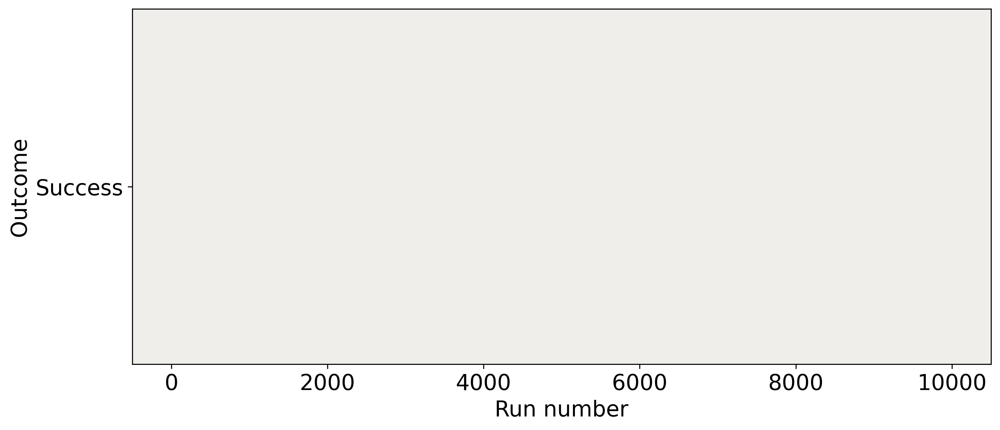

In [7]:
plt.rcParams['figure.dpi'] = 300
plt.rcParams.update({'font.size': 17})

qtable = np.zeros((64,6))

values_ops = [0, 1, 2, 3, 4, 5]

# Parameters
episodes = 10000        # Total number of episodes
alpha = 0.8            # Learning rate
gamma = 0.9            # Discount factor

# List of outcomes to plot
outcomes = []

print('Q-table before training:')
print(qtable)

# Training
for _ in range(episodes):
    state = env.reset()
    done = False

    # By default, we consider our outcome to be a failure
    outcomes.append("Failure")

    # Until the agent gets stuck in a hole or reaches the goal, keep training it
    while not done:
        # Choose the action with the highest value in the current state
        if np.max(qtable[state]) > 0:
            action = np.argmax(qtable[state])

        # If there's no best action (only zeros), take a random one
        else:
            action = env.action_space.sample()
            print("This is the action chosen: {}".format(action))
            action = env.carolschoice(action)
            print("This is the action Carol chose: {}".format(action))
             
        # Implement this action and move the agent in the desired direction
        bank, new_state, reward, done, info = env.step(action)

        # Update Q(s,a)
        action = values_ops[Actions(action)] 
        print(action)
        qtable[state, action] = qtable[state, action] + \
                                alpha * (reward + gamma * np.max(qtable[new_state]) - qtable[state, action])
        print(qtable[state, action])
        
        # Update our current state
        state = new_state

        if reward:
            outcomes[-1] = "Success"

print()
print('===========================================')
print('Q-table after training:')
print(qtable)

# Plot outcomes
plt.figure(figsize=(12, 5))
plt.xlabel("Run number")
plt.ylabel("Outcome")
ax = plt.gca()
ax.set_facecolor('#efeeea')
plt.bar(range(len(outcomes)), outcomes, color="#0A047A", width=1.0)
plt.show()

In [ ]:
#import matplotlib.pyplot as plt
plt.rcParams['figure.dpi'] = 300
plt.rcParams.update({'font.size': 17})

# We re-initialize the Q-table
qtable = np.zeros((64, 5))

# Hyperparameters
episodes = 1000        # Total number of episodes
alpha = 0.5            # Learning rate
gamma = 0.9            # Discount factor

# List of outcomes to plot
outcomes = []

print('Q-table before training:')
print(qtable)

# Training
for _ in range(episodes):
    state = env.reset()
    done = False

    # By default, we consider our outcome to be a failure
    outcomes.append("Failure")

    # Until the agent gets stuck in a hole or reaches the goal, keep training it
    while not done:
        # Choose the action with the highest value in the current state
        if np.max(qtable[state]) > 0:
            action = np.argmax(qtable[state])

        # If there's no best action (only zeros), take a random one
        else:
            action = env.action_space.sample()
             
        # Implement this action and move the agent in the desired direction
        new_state, reward, done, info = env.step(action)

        # Update Q(s,a)
        qtable[state, action] = qtable[state, action] + \
                                alpha * (reward + gamma * np.max(qtable[new_state]) - qtable[state, action])
        
        # Update our current state
        state = new_state

        # If we have a reward, it means that our outcome is a success
        if reward:
            outcomes[-1] = "Success"

print()
print('===========================================')
print('Q-table after training:')
print(qtable)

# Plot outcomes
plt.figure(figsize=(12, 5))
plt.xlabel("Run number")
plt.ylabel("Outcome")
ax = plt.gca()
ax.set_facecolor('#efeeea')
plt.bar(range(len(outcomes)), outcomes, color="#0A047A", width=1.0)
plt.show()

In [10]:
episodes = 1000
nb_success = 0

# Evaluation
for _ in range(1000):
    state = env.reset()
    done = False
    
    # Until the agent gets stuck or reaches the goal, keep training it
    while not done:
        # Choose the action with the highest value in the current state
        if np.max(qtable[state]) > 0:
            action = np.argmax(qtable[state])

        # If there's no best action (only zeros), take a random one
        else:
            action = env.action_space.sample()
            print("This is the action chosen: {}".format(action))
            action = env.carolschoice(action)
            print("This is the action Carol chose: {}".format(action))
             
        # Implement this action and move the agent in the desired direction

        # Update Q(s,a)
        action = values_ops[Actions(action)] 
             
        bank, new_state, reward, done, info = env.step(action)

        # Update our current state
        state = new_state

        # If we have a reward, it means that our outcome is a success
        nb_success += reward

print (f"Success rate = {nb_success/episodes*100}%")

This is the action chosen: 1
This is the action Carol chose: 1
This is the action chosen: 4
This is the action Carol chose: 4
This is the action chosen: 2
This is the action Carol chose: 2
This is the action chosen: 1
This is the action Carol chose: 1
This is the action chosen: 4
This is the action Carol chose: East
This is the action chosen: 1
This is the action Carol chose: 1
This is the action chosen: 2
This is the action Carol chose: East
This is the action chosen: 2
This is the action Carol chose: 2
You have been caught; game is over
This is the action chosen: 4
This is the action Carol chose: 4
This is the action chosen: 3
This is the action Carol chose: East
This is the action chosen: 1
This is the action Carol chose: 1
This is the action chosen: 1
This is the action Carol chose: 1
This is the action chosen: 3
This is the action Carol chose: 3
This is the action chosen: 1
This is the action Carol chose: East
This is the action chosen: 4
This is the action Carol chose: North
This

This is the action chosen: 1
This is the action Carol chose: North
This is the action chosen: 4
This is the action Carol chose: East
This is the action chosen: 3
This is the action Carol chose: North
This is the action chosen: 3
This is the action Carol chose: 3
This is the action chosen: 0
This is the action Carol chose: North
This is the action chosen: 4
This is the action Carol chose: East
This is the action chosen: 1
This is the action Carol chose: 1
This is the action chosen: 3
This is the action Carol chose: East
You have been caught; game is over
This is the action chosen: 4
This is the action Carol chose: North
This is the action chosen: 3
This is the action Carol chose: 3
This is the action chosen: 3
This is the action Carol chose: 3
This is the action chosen: 0
This is the action Carol chose: North
This is the action chosen: 3
This is the action Carol chose: North
This is the action chosen: 0
This is the action Carol chose: East
This is the action chosen: 2
This is the action

In [ ]:
from IPython.display import clear_output
import time 

state = env.reset()
done = False
sequence = []

while not done:
    # Choose the action with the highest value in the current state
    if np.max(qtable[state]) > 0:
        action = np.argmax(qtable[state])

    # If there's no best action (only zeros), take a random one
    else:
        action = env.action_space.sample()
    
    # Add the action to the sequence
    sequence.append(action)

    # Implement this action and move the agent in the desired direction
    new_state, reward, done, info = env.step(action)

    # Update our current state
    state = new_state

    # Update the render
    clear_output(wait=True)
    env.render()
    time.sleep(1)

print(f"Sequence = {sequence}")

In [ ]:
action1 = env.choose_action()
action1 = env.